___Описание проекта___  
___Инвесторы из фонда «Shut Up and Take My Money» решили попробовать себя в новой области и открыть заведение общественного питания в Москве. Заказчики ещё не знают, что это будет за место: кафе, ресторан, пиццерия, паб или бар, — и какими будут расположение, меню и цены.___  

___Для начала они просят вас — аналитика — подготовить исследование рынка Москвы, найти интересные особенности и презентовать полученные результаты, которые в будущем помогут в выборе подходящего инвесторам места.
Постарайтесь сделать презентацию информативной и лаконичной. Её структура и оформление сильно влияют на восприятие информации читателями вашего исследования. Выбирать инструменты (matplotlib, seaborn и другие) и типы визуализаций вы можете самостоятельно.___  

___Вам доступен датасет с заведениями общественного питания Москвы, составленный на основе данных сервисов Яндекс Карты и Яндекс Бизнес на лето 2022 года. Информация, размещённая в сервисе Яндекс Бизнес, могла быть добавлена пользователями или найдена в общедоступных источниках. Она носит исключительно справочный характер.___  


In [1]:
import pandas as pd
from matplotlib import pyplot as plt
import seaborn as sns
import numpy as np
from folium import Map, Choropleth
from folium import Map, Marker
from folium.plugins import MarkerCluster
import warnings
warnings.simplefilter('ignore')


___Шаг 1. Загрузите данные и изучите общую информацию
Загрузите данные о заведениях общественного питания Москвы.
Путь к файлу: /datasets/moscow_places.csv
Изучите общую информацию о датасете. Сколько заведений представлено? Что можно сказать о каждом столбце? Значения какого типа они хранят?___

In [2]:
data=pd.read_csv('/datasets/moscow_places.csv')
data.head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0


In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


__Всего в датасете представлено 8406 заведений общественного питания. Солбцы хранят значения типа object, float64 и int__

___Шаг 2. Выполните предобработку данных___  
___Изучите, есть ли дубликаты в данных. Поищите пропуски: встречаются ли они, в каких столбцах? Можно ли их обработать или оставить как есть?___  
___Выполните предобработку данных:___  
___Создайте столбец street с названиями улиц из столбца с адресом.___  
___Создайте столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):___  
___логическое значение True — если заведение работает ежедневно и круглосуточно;___  
___логическое значение False — в противоположном случае.___  

In [4]:
print(f'Количество дупликатов в датасете-{data.duplicated().sum()}')

Количество дупликатов в датасете-0


In [5]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


__Дупликатов в датасете нет. В столбцах hours(время работы заведения),price(уровень цен),avg_bill(средний чек),middle_avg_bill(среднее значение среднего чека),middle_coffee_cup(средняя стоимость чашки капучино),seats(количество посадочных мест) есть пропуски.Решила оставить как есть ,не заполнять пропуски, т.к если запонять пропуски количественных данных медианой или средним ,на результате исследования это не отразится ,или даже исказит картину.__

In [6]:
#напишем функцию ,которая будет возвращать первое значение из строки столбца address,встречающееся после запятой и пробела
#это и будет навание улицы
def street_name(row):
    adress=row['address'].split(', ')
    street=adress[1]
    return street
data['street_name']=data.apply(street_name,axis=1) #применив функцию street_name создали новый столбец с названиями улиц
data.head(10)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street_name
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN,Ижорская улица
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0,Клязьминская улица
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0,Клязьминская улица
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0,Дмитровское шоссе
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0,Ангарская улица


In [7]:
data['hours'].value_counts()

ежедневно, 10:00–22:00                                                    759
ежедневно, круглосуточно                                                  730
ежедневно, 11:00–23:00                                                    396
ежедневно, 10:00–23:00                                                    310
ежедневно, 12:00–00:00                                                    254
                                                                         ... 
пн-пт 12:00–01:00                                                           1
пн-пт 07:30–21:00; сб 08:00–20:00; вс 08:00–18:00                           1
пн-пт 07:00–21:00; сб,вс 08:00–18:00                                        1
пн 10:00–00:00; вт-сб круглосуточно; вс 00:00–23:00                         1
пн-ср 08:00–23:00; чт 08:00–00:00; пт,сб круглосуточно; вс 00:00–23:00      1
Name: hours, Length: 1307, dtype: int64

In [8]:
#создаем новый столбец is 24/7,указывающий, что заведение работает круглосуточно
data['is_24/7']=data['hours'].str.contains('ежедневно, круглосуточно') 
data.head(20)

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street_name,is_24/7
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN,улица Дыбенко,False
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0,улица Дыбенко,False
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0,Клязьминская улица,False
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN,улица Маршала Федоренко,False
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0,Правобережная улица,False
5,Sergio Pizza,пиццерия,"Москва, Ижорская улица, вл8Б",Северный административный округ,"ежедневно, 10:00–23:00",55.888010,37.509573,4.6,средние,NaN,NaN,NaN,0,NaN,Ижорская улица,False
6,Огни города,"бар,паб","Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,пн 15:00–04:00; вт-вс 15:00–05:00,55.890752,37.524653,4.4,средние,Средний счёт:199 ₽,199.0,NaN,0,45.0,Клязьминская улица,False
7,Mr. Уголёк,быстрое питание,"Москва, Клязьминская улица, 9, стр. 3",Северный административный округ,"пн-чт 10:00–22:00; пт,сб 10:00–23:00; вс 10:00...",55.890636,37.524303,4.7,средние,Средний счёт:200–300 ₽,250.0,NaN,0,45.0,Клязьминская улица,False
8,Donna Maria,ресторан,"Москва, Дмитровское шоссе, 107, корп. 4",Северный административный округ,"ежедневно, 10:00–22:00",55.880045,37.539006,4.8,средние,Средний счёт:от 500 ₽,500.0,NaN,0,79.0,Дмитровское шоссе,False
9,Готика,кафе,"Москва, Ангарская улица, 39",Северный административный округ,"ежедневно, 12:00–00:00",55.879038,37.524487,4.3,средние,Средний счёт:1000–1200 ₽,1100.0,NaN,0,65.0,Ангарская улица,False


In [9]:
print(f'Количество уникальных названий заведений:')
len(data['name'].unique())

Количество уникальных названий заведений:


5614

_Напишем функцию , которая найдет неявные дупликаты в названиях заведений_

In [10]:
def new_name(word):
    word=word.replace('ё','е')
    word=word.lower()
    dict=['ресторан ','кафе ','кафе-бар ','кофейня ','пиццерия ','столовая ']
    for i in dict:
        word=word.replace(i, '')
    return word
data['name']=data['name'].apply(new_name)

print(f'Количество уникальных названий заведений после очистки:')
len(data['name'].unique())


Количество уникальных названий заведений после очистки:


5458

__В результате предоработки данных было создано 2 новых столбца : street_name(названия улиц), и is 24/7(указывающие заведения,работающие круглосуточно). Так же немного очистила столбец с названиями заведений , после чего уикальных названий стало на 156 меньше__

___Шаг 3. Анализ данных___  
___Какие категории заведений представлены в данных? Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Ответьте на вопрос о распределении заведений по категориям.___ 

In [11]:
print(f'В датасете представлены категории заведений:')
data['category'].unique()

В датасете представлены категории заведений:


array(['кафе', 'ресторан', 'кофейня', 'пиццерия', 'бар,паб',
       'быстрое питание', 'булочная', 'столовая'], dtype=object)

In [12]:
data_category=data.pivot_table(index='category',values='name',aggfunc='count').reset_index()
data_category.columns=['category','total']
data_category=data_category.sort_values(by='total',ascending=False).reset_index(drop=True)
data_category

,category,total
0,кафе,2378
1,ресторан,2043
2,кофейня,1413
3,"бар,паб",765
4,пиццерия,633
5,быстрое питание,603
6,столовая,315
7,булочная,256


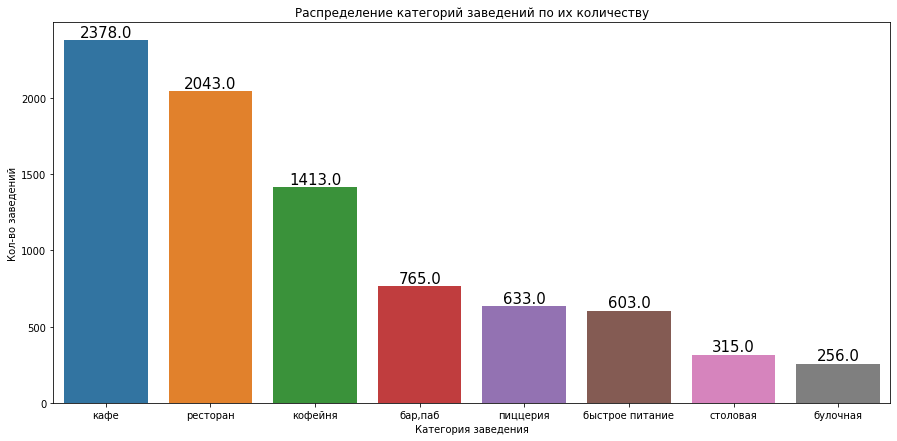

In [13]:
plt.figure(figsize=(15,7))
#plt.bar(data_category['category'],data_category['total'])
plots=sns.barplot(data=data_category,x='category',y='total')
for bar in plots.patches:
    plots.annotate(format(bar.get_height()),
                   (bar.get_x() + bar.get_width() / 2,
                    bar.get_height()), ha='center', va='center',
                   size=15, xytext=(0, 8),
                   textcoords='offset points')
plt.title('Распределение категорий заведений по их количеству')
plt.xlabel('Категория заведения')
plt.ylabel('Кол-во заведений')
plt.show()

__Больше всего в датасете представлено кафе,ресторанов и кофейн. Меньше всего столовых и булочных__

___Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Проанализируйте результаты и сделайте выводы.___  

In [14]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
 14  street_name        8406 non-null   object 
 15  is_24/7            7870 non-null   object 
dtypes: float64(6), int64(1),

In [15]:
data.seats.describe(percentiles=[0.05, 0.25, 0.5, 0.75, 0.95, 0.96,0.97,0.98,0.99])

count    4795.000000
mean      108.421689
std       122.833396
min         0.000000
5%          6.000000
25%        40.000000
50%        75.000000
75%       140.000000
95%       307.000000
96%       350.000000
97%       350.000000
98%       480.000000
99%       625.000000
max      1288.000000
Name: seats, dtype: float64

__Исследовав значения столбца seats(количество посадочных мест) с помощью перцентилей , видим , что 50% заведений имеют 75 мест и более, 25% заведений имеют 140 мест и более, 5% заведений имеют 307 посадочных мест и более,2% заведений имеют 480 посадочных мест и более,1% имеет 625 посадочных мест и более, и максимальное колиество посадочных мест 1288__

_Проверим ,много ли заведений без посадочных мест_

In [16]:
data1=data.loc[data['seats']==0]
print(f'Заведений без посадочных мест:')
len(data1['seats'])

Заведений без посадочных мест:


136

In [17]:
data1.groupby('category')['name'].count()

category
бар,паб             4
булочная           11
быстрое питание    18
кафе               44
кофейня            24
пиццерия           10
ресторан           20
столовая            5
Name: name, dtype: int64

__Проверив ,какие это категории заведений , решила их оставить , возможно владельцы забыли указать количество посадочных мест__

_Посмотрим ,как количество посадочных мест зависит от категории заведения_

In [18]:
data_seats=data.pivot_table(index='category',values='seats',aggfunc='median').reset_index()
data_seats.columns=['category','seats_total']
data_seats=data_seats.sort_values(by='seats_total',ascending=False).reset_index(drop=True)
data_seats


,category,seats_total
0,ресторан,86.0
1,"бар,паб",82.5
2,кофейня,80.0
3,столовая,75.5
4,быстрое питание,65.0
5,кафе,60.0
6,пиццерия,55.0
7,булочная,50.0


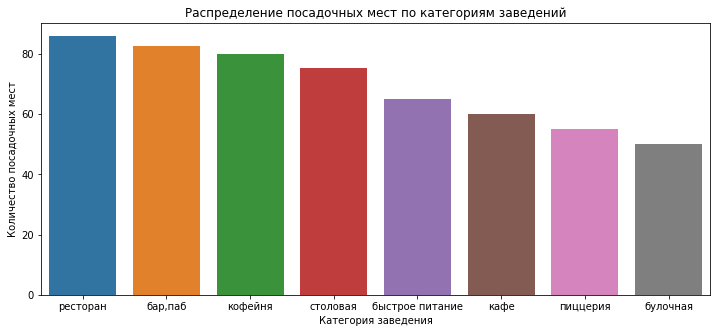

In [19]:
plt.figure(figsize=(12,5))
sns.barplot(data=data_seats,x='category',y='seats_total')
plt.xlabel('Категория заведения')
plt.ylabel('Количество посадочных мест')
plt.title('Распределение посадочных мест по категориям заведений')
plt.show()

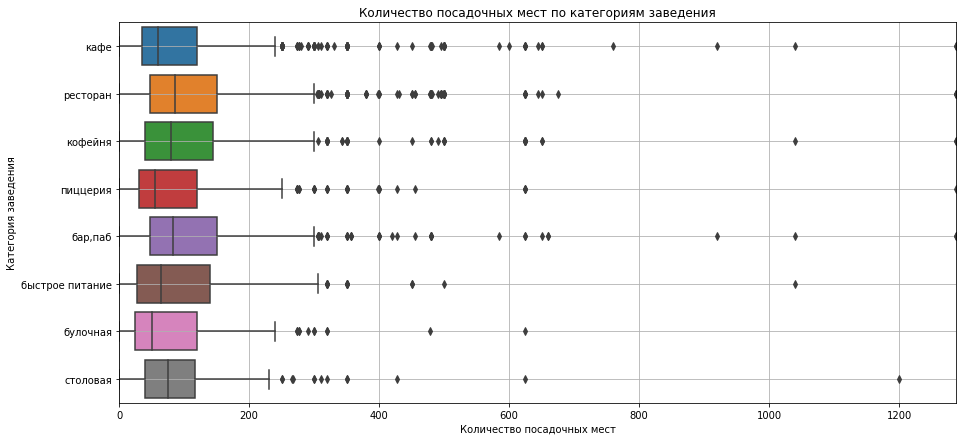

In [20]:
plt.figure(figsize=(15, 7))
sns.boxplot(x='seats', y='category', data=data) 
plt.xlabel('Количество посадочных мест')
plt.ylabel('Категория заведения')
plt.xlim(0,1288)
plt.grid()
plt.title('Количество посадочных мест по категориям заведения')
plt.show()

In [21]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 16 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
 14  street_name        8406 non-null   object 
 15  is_24/7            7870 non-null   object 
dtypes: float64(6), int64(1),

__Больше всего посадочных мест в ресторанах, барах,кофейнях и столовых.Аномально большое количество посадочных мест (более 400) чаще встречается в ресторанах,кафе,кофейнях и барах. Меньше всего посадочных мест в булочных__

___Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?___

In [22]:
is_chain=data.pivot_table(index='chain',values='name',aggfunc='count').reset_index()
is_chain.columns=['chain','qtt']
is_chain

,chain,qtt
0,0,5201
1,1,3205


_В датасете представлено 5201 несетевое заведение и 3205 сетевое_

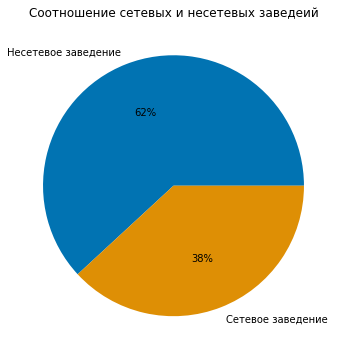

In [23]:
plt.figure(figsize=(10,6))
labels = ['Несетевое заведение', 'Сетевое заведение']
plt.title('Соотношение сетевых и несетевых заведеий')

#define Seaborn color palette to use
colors = sns.color_palette('colorblind')[ 0:2 ]

#create pie chart
plt.pie(is_chain['qtt'], labels = labels, colors = colors, autopct='%.0f%%')
plt.show()

__Соотношение количества несетевых заведений к сетевым в датасете-62%/38%__

___Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.___  

In [24]:
data_chain=data.query('chain==1').pivot_table(index='category',values='name',aggfunc='count').reset_index()
data_chain=data_chain.sort_values(by='name',ascending=False).reset_index(drop=True)
data_chain

,category,name
0,кафе,779
1,ресторан,730
2,кофейня,720
3,пиццерия,330
4,быстрое питание,232
5,"бар,паб",169
6,булочная,157
7,столовая,88


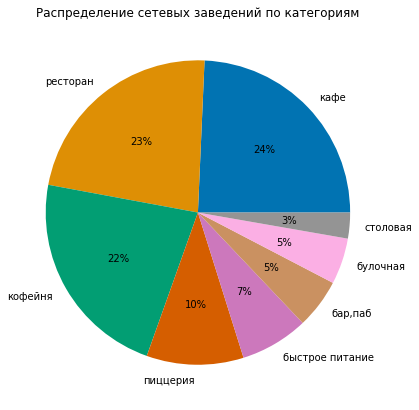

In [25]:
plt.figure(figsize=(15,7))
labels = data_chain['category']
plt.title('Распределение сетевых заведений по категориям')

#define Seaborn color palette to use
colors = sns.color_palette('colorblind')[ 0:8 ]

#create pie chart
plt.pie(data_chain['name'], labels = labels, colors = colors, autopct='%.0f%%')
plt.show()

__Среди сетевых заведений больше всего ресторанов ,кафе, кофейн и пиццерий , меньше всего столовых, булочных и баров__

___Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?___  

In [26]:
pop_chains=data.query('chain==1').groupby('name')['name'].count().sort_values(ascending=False).head(15)
pop_chains
pop_chains=pd.DataFrame({'name':pop_chains.index, 'qtt':pop_chains.values})


In [27]:
pop_chains

,name,qtt
0,шоколадница,120
1,домино'с пицца,76
2,додо пицца,74
3,one price coffee,71
4,яндекс лавка,69
5,cofix,65
6,prime,50
7,хинкальная,44
8,кофепорт,42
9,кулинарная лавка братьев караваевых,39


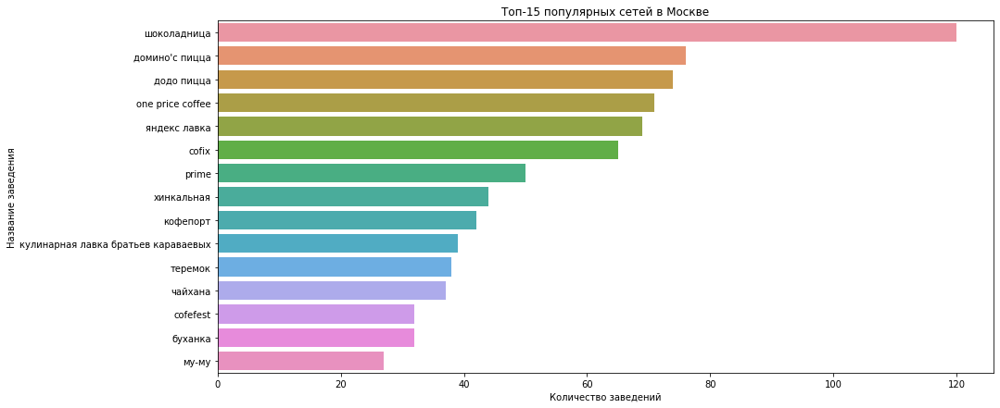

In [28]:
plt.figure(figsize=(15,7))
sns.barplot(data=pop_chains,x='qtt',y='name')
plt.xlabel('Количество заведений')
plt.ylabel('Название заведения')
plt.title('Топ-15 популярных сетей в Москве')
plt.show()

__В топ-15 популярных сетей Москвы входят в основном кофейни , пиццерии, кафе и пекарни__

_Посмотрим , как в целом распределены сети по категориям заведений_

In [29]:
chains_category=data.query('chain==1').pivot_table(index='category',values='name',aggfunc='count').sort_values(by='name',ascending=False)
chains_category

,name
category,
кафе,779
ресторан,730
кофейня,720
пиццерия,330
быстрое питание,232
"бар,паб",169
булочная,157
столовая,88


__Больше всего сетевых ресторанов ,кафе, кофейн и пиццерий.Но этих заведений в целом больше представлено в датасете. Посмотрим соотношение сетевых и несетевых заведений. В какой категории заведений сети занимают большую часть :__

In [30]:
category_chain=data.pivot_table(index='category',values='name',columns='chain',aggfunc='count')
category_chain=category_chain.reset_index()
category_chain.columns=['category','not_chain','chain']
category_chain['total']=category_chain['not_chain']+category_chain['chain']
category_chain['part_chain%']=round(category_chain['chain']/category_chain['total'],2)*100
category_chain=category_chain.sort_values(by='part_chain%',ascending=False).reset_index(drop=True)
category_chain

,category,not_chain,chain,total,part_chain%
0,булочная,99,157,256,61.0
1,пиццерия,303,330,633,52.0
2,кофейня,693,720,1413,51.0
3,быстрое питание,371,232,603,38.0
4,ресторан,1313,730,2043,36.0
5,кафе,1599,779,2378,33.0
6,столовая,227,88,315,28.0
7,"бар,паб",596,169,765,22.0


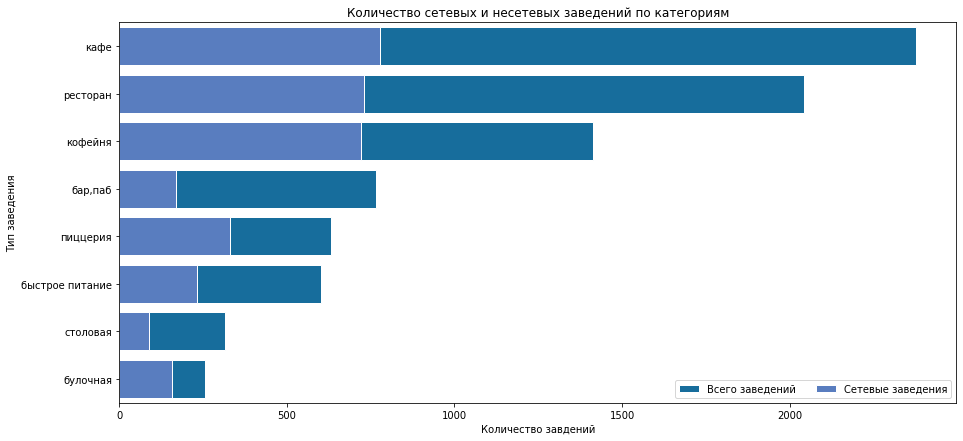

In [31]:
f, ax = plt.subplots(figsize = (15,7))
sns.set_color_codes('colorblind')
sns.barplot(x='total',y='category',data=category_chain.sort_values(by='total',ascending=False),
            label='Всего заведений',color='b',edgecolor='w')
sns.set_color_codes('muted')
sns.barplot(x='chain',y='category',data=category_chain.sort_values(by='total',ascending=False),
            label='Сетевые заведения',color='b',edgecolor='w')
ax.legend(ncol= 2,loc='lower right')
ax.set(ylabel="Тип заведения",xlabel="Количество завдений")
ax.set_title("Количество сетевых и несетевых заведений по категориям")

plt.show()

__Сети занимаю 61% среди булочных, 52% среди пиццерий , 51% среди кофейн,38% среди заведений быстрого питания, 36% среди ресторанов,33% -среди кафе,28%-среди столовых, 22%-среди баров__

___Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.___

In [32]:
print(f'В датасете присутствуют следующие административные районы Москвы:' )
data['district'].unique()

В датасете присутствуют следующие административные районы Москвы:


array(['Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'], dtype=object)

In [33]:
district_data=data.pivot_table(index='district',values='name',columns='category',aggfunc='count').reset_index()
#district_data['total']=district_data[['бар,паб','булочная','быстрое питание','кафе','кофейня','пиццерия','ресторан','столовая']].sum(axis=1)
district_data

category,district,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
0,Восточный административный округ,53,25,71,272,105,72,160,40
1,Западный административный округ,50,37,62,239,150,71,218,24
2,Северный административный округ,68,39,58,235,193,77,189,41
3,Северо-Восточный административный округ,63,28,82,269,159,68,182,40
4,Северо-Западный административный округ,23,12,30,115,62,40,109,18
5,Центральный административный округ,364,50,87,464,428,113,670,66
6,Юго-Восточный административный округ,38,13,67,282,89,55,145,25
7,Юго-Западный административный округ,38,27,61,238,96,64,168,17
8,Южный административный округ,68,25,85,264,131,73,202,44


In [34]:
district_data1=data.pivot_table(index='district',values='name',aggfunc='count').reset_index().sort_values(by='name',ascending=False)
district_data1

,district,name
5,Центральный административный округ,2242
2,Северный административный округ,900
8,Южный административный округ,892
3,Северо-Восточный административный округ,891
1,Западный административный округ,851
0,Восточный административный округ,798
6,Юго-Восточный административный округ,714
7,Юго-Западный административный округ,709
4,Северо-Западный административный округ,409


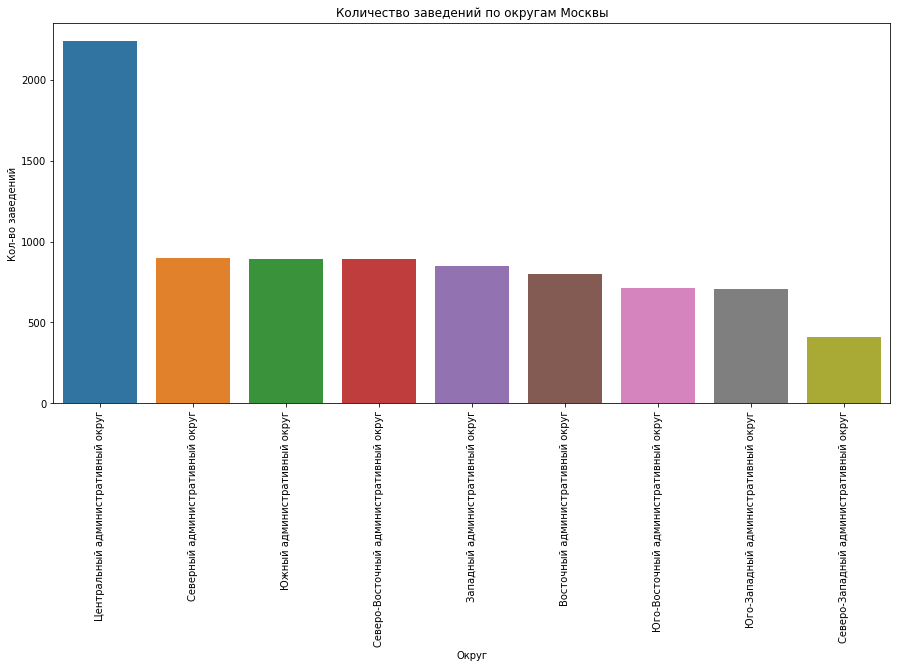

In [35]:
plt.figure(figsize=(15,7))
sns.barplot(data=district_data1,x='district',y='name')
plt.title('Количество заведений по округам Москвы')
plt.xlabel('Округ')
plt.ylabel('Кол-во заведений')
plt.xticks(rotation=90)
plt.show()

__В Центральном округе заведений в 2 раза больше ,чем в остальных округах. Наименьшее количество заведений в Северо-Западном округе__

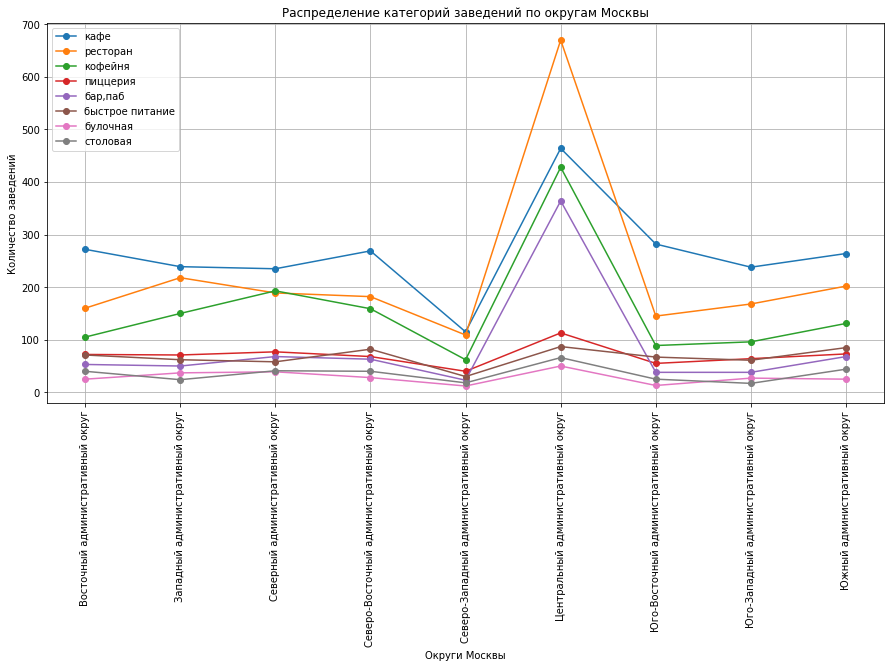

In [36]:
fig, ax = plt.subplots(figsize=(15, 7))

for i in list(data.category.unique()):
    ax.plot(district_data.district, district_data.loc[:, i], marker ='o', label=i)

plt.xticks(district_data.district)
plt.xticks(rotation=90)
plt.xlabel('Округи Москвы')
plt.ylabel('Количество заведений')
plt.grid()
plt.legend(loc='upper left')
plt.title('Распределение категорий заведений по округам Москвы')
plt.show()

In [37]:
district_data

category,district,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
0,Восточный административный округ,53,25,71,272,105,72,160,40
1,Западный административный округ,50,37,62,239,150,71,218,24
2,Северный административный округ,68,39,58,235,193,77,189,41
3,Северо-Восточный административный округ,63,28,82,269,159,68,182,40
4,Северо-Западный административный округ,23,12,30,115,62,40,109,18
5,Центральный административный округ,364,50,87,464,428,113,670,66
6,Юго-Восточный административный округ,38,13,67,282,89,55,145,25
7,Юго-Западный административный округ,38,27,61,238,96,64,168,17
8,Южный административный округ,68,25,85,264,131,73,202,44


__Если рассматривать Центральный округ с наибольшим количеством заведений -здесь больше всего ресторанов, затем по количеству -кафе, затем-кофейни ,затем бары,затем пиццерии ,затем заведения быстрого питания,затем столовые и булочные.__  
__В остальных округах количество заведений разных категорий распределены примерно так же , стоит отметить только , что во всех остальных округах кафе больше ,чем ресторанов__  

___Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?___

In [38]:
data_rating=data.pivot_table(index='category',values='rating',aggfunc='mean').reset_index().sort_values(by='rating',ascending=False)
data_rating['rating']=round(data_rating['rating'],2)
data_rating

,category,rating
0,"бар,паб",4.39
5,пиццерия,4.30
6,ресторан,4.29
4,кофейня,4.28
1,булочная,4.27
7,столовая,4.21
3,кафе,4.12
2,быстрое питание,4.05


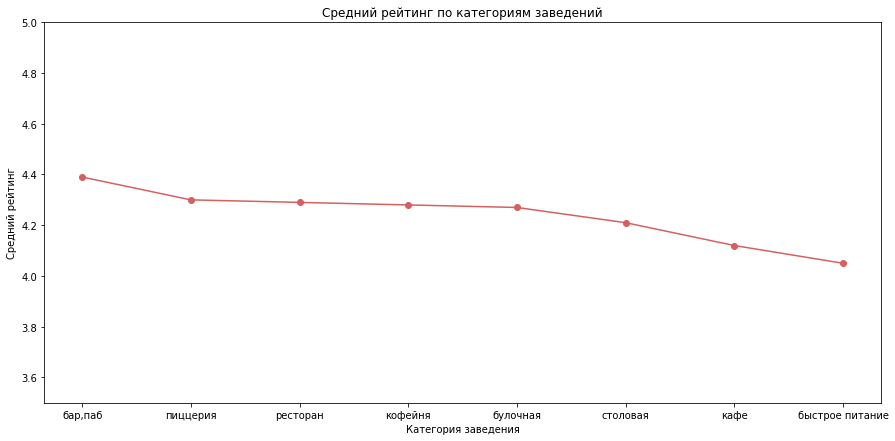

In [39]:
fig, ax = plt.subplots(figsize=(15, 7))
plt.plot(data_rating['category'],data_rating['rating'],marker='o',color='r')
ax.set_ylim([3.5,5])
ax.set_xlabel('Категория заведения')
ax.set_ylabel('Средний рейтинг')
ax.set_title('Средний рейтинг по категориям заведений')
plt.show()

__Усредненные рейтинги рпзличных категорий заведений различаются не сильно (от 4.05 до 4.39) Относительно высокие рейтинги у ре баров,ресторанов,пиццерий и кофеен низкие-у заведений быстрого питания__

___Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson___

In [40]:
district_rating=data.groupby('district',as_index=False)['rating'].agg('mean').sort_values(by='rating',ascending=False)
district_rating['rating']=round(district_rating['rating'],2)
district_rating

,district,rating
5,Центральный административный округ,4.38
2,Северный административный округ,4.24
4,Северо-Западный административный округ,4.21
8,Южный административный округ,4.18
1,Западный административный округ,4.18
0,Восточный административный округ,4.17
7,Юго-Западный административный округ,4.17
3,Северо-Восточный административный округ,4.15
6,Юго-Восточный административный округ,4.10


In [41]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=district_rating,
    columns=['district', 'rating'],
    key_on='feature.name',
    fill_color='YlGnBu',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

___Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.___

In [42]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data.apply(create_clusters, axis=1)

# выводим карту
m

___Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.___

In [43]:
street_data=data.groupby('street_name',as_index=False)['name'].agg('count').sort_values(by='name',ascending=False).head(15)
street_data

,street_name,name
1090,проспект Мира,184
773,Профсоюзная улица,122
1087,проспект Вернадского,108
525,Ленинский проспект,107
523,Ленинградский проспект,95
373,Дмитровское шоссе,88
455,Каширское шоссе,77
298,Варшавское шоссе,76
524,Ленинградское шоссе,70
550,МКАД,65


In [44]:
street_name=street_data['street_name'].to_list()
data_best_street=data.query('street_name in @street_name')
street_data1=data_best_street.pivot_table(index='street_name',values='name',columns='category',aggfunc='count').reset_index()
street_data1


category,street_name,"бар,паб",булочная,быстрое питание,кафе,кофейня,пиццерия,ресторан,столовая
0,Варшавское шоссе,6.0,NaN,7.0,18.0,14.0,4.0,20.0,7.0
1,Дмитровское шоссе,6.0,2.0,10.0,23.0,11.0,8.0,24.0,4.0
2,Каширское шоссе,2.0,NaN,10.0,20.0,16.0,5.0,19.0,5.0
3,Кутузовский проспект,2.0,1.0,2.0,14.0,13.0,3.0,16.0,3.0
4,Ленинградский проспект,15.0,4.0,2.0,12.0,25.0,9.0,25.0,3.0
5,Ленинградское шоссе,5.0,2.0,5.0,13.0,13.0,3.0,26.0,3.0
6,Ленинский проспект,10.0,3.0,2.0,26.0,23.0,5.0,33.0,5.0
7,Люблинская улица,5.0,NaN,5.0,26.0,11.0,1.0,10.0,2.0
8,МКАД,1.0,NaN,9.0,45.0,4.0,NaN,5.0,1.0
9,Профсоюзная улица,6.0,4.0,15.0,35.0,18.0,15.0,26.0,3.0


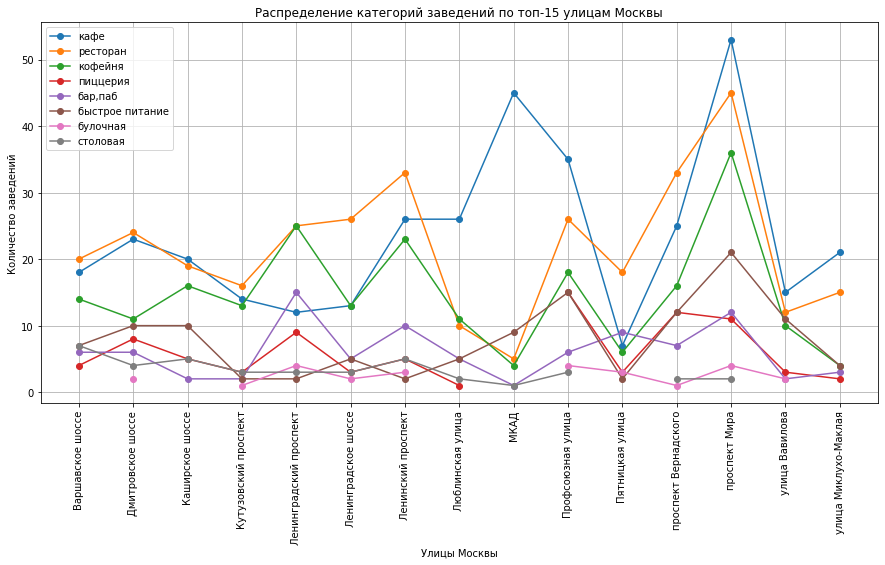

In [45]:
fig, ax = plt.subplots(figsize=(15, 7))

for i in list(data.category.unique()):
    ax.plot(street_data1.street_name, street_data1.loc[:, i], marker ='o', label=i)

plt.xticks(street_data1.street_name)
plt.xticks(rotation=90)
plt.xlabel('Улицы Москвы')
plt.ylabel('Количество заведений')
plt.grid()
plt.legend(loc='upper left')
plt.title('Распределение категорий заведений по топ-15 улицам Москвы')
plt.show()

__По графику видно, что кафе больше всего на МКАДе и на Проспекте Мира, а ресторанов на МАКАДе наоборот меньше, чем на дргих топ-улицах.На Проспекте Мира так же больше всего кофеен и заведений быстрого питания__

___Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?___ 

In [46]:
street_one=data.groupby('street_name',as_index=False)['name'].agg('count')
street_one1=street_one.query('name==1')
street_one1

,street_name,name
0,1-й Автозаводский проезд,1
1,1-й Балтийский переулок,1
2,1-й Варшавский проезд,1
3,1-й Вешняковский проезд,1
5,1-й Голутвинский переулок,1
...,...,...
1436,улица Шкулёва,1
1437,улица Шкулёва 4,1
1439,улица Шухова,1
1442,улица Юннатов,1


_Всего 458 улиц , на которых находится 1 объект общепита_

In [47]:
street_1=street_one1['street_name'].to_list()
data_street_one=data.query('street_name in @street_1')

In [48]:
data_street_one1=data_street_one.groupby('category',as_index=False)['name'].agg('count').sort_values(by='name',ascending=False)
data_street_one1

,category,name
3,кафе,160
6,ресторан,93
4,кофейня,84
0,"бар,паб",39
7,столовая,36
2,быстрое питание,23
5,пиццерия,15
1,булочная,8


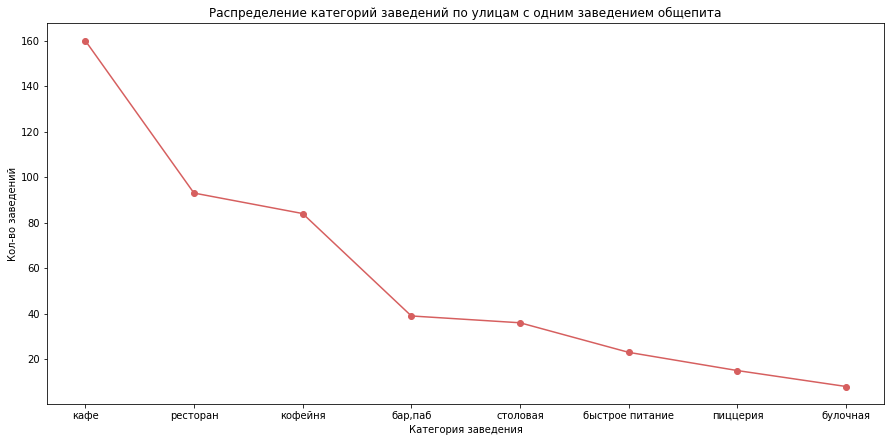

In [49]:
fig, ax = plt.subplots(figsize=(15, 7))
plt.plot(data_street_one1['category'],data_street_one1['name'],marker='o',color='r')
ax.set_xlabel('Категория заведения')
ax.set_ylabel('Кол-во заведений')
ax.set_title('Распределение категорий заведений по улицам с одним заведением общепита')
plt.show()

In [50]:
print(f'Всего заведений на улицах с одним объектом общепита')
data_street_one['name'].count()

Всего заведений на улицах с одним объектом общепита


458

In [51]:
print(f'Уникальных названий заведений на улицах с одним объектом общепита')
data_street_one['name'].nunique()


Уникальных названий заведений на улицах с одним объектом общепита


403

__Среди этих объектов больше всего кафе,ресторанов и кофеен.Меньше всего булочных и пиццерий.Так же можно отметить ,что эти заведения в основном несетевые (т.к уникальных названий всего на 55 меньше чем всех названий)__

___Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?___

In [52]:
data_avg_bill=data.groupby('district',as_index=False)['middle_avg_bill'].agg('median').sort_values(by='middle_avg_bill',ascending=False)
data_avg_bill

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [53]:
# загружаем JSON-файл с границами округов Москвы
state_geo = '/datasets/admin_level_geomap.geojson'
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# создаём хороплет с помощью конструктора Choropleth и добавляем его на карту
Choropleth(
    geo_data=state_geo,
    data=data_avg_bill,
    columns=['district', 'middle_avg_bill'],
    key_on='feature.name',
    fill_color='YlOrRd',
    fill_opacity=0.8,
    legend_name='Средний рейтинг заведений по районам',
).add_to(m)

# выводим карту
m

__Дороже всего цены в заведениях в Центральном и Западном округе(средний чек 1000р), ниже всего- в Юго-восточном округе-450р.Средние цены в остальых округах (средний чек от 500р до 700р)__

___Необязательное задание: проиллюстрируйте другие взаимосвязи, которые вы нашли в данных. Например, по желанию исследуйте часы работы заведений и их зависимость от расположения и категории заведения. Также можно исследовать особенности заведений с плохими рейтингами, средние чеки в таких местах и распределение по категориям заведений.___

_Посмотрим на взаимосвязь рейтинга заведений в округах Москвы и среднего чека_

In [54]:
data_avg_bill['rating']=district_rating['rating']
data_avg_bill

,district,middle_avg_bill,rating
1,Западный административный округ,1000.0,4.18
5,Центральный административный округ,1000.0,4.38
4,Северо-Западный административный округ,700.0,4.21
2,Северный административный округ,650.0,4.24
7,Юго-Западный административный округ,600.0,4.17
0,Восточный административный округ,575.0,4.17
3,Северо-Восточный административный округ,500.0,4.15
8,Южный административный округ,500.0,4.18
6,Юго-Восточный административный округ,450.0,4.10


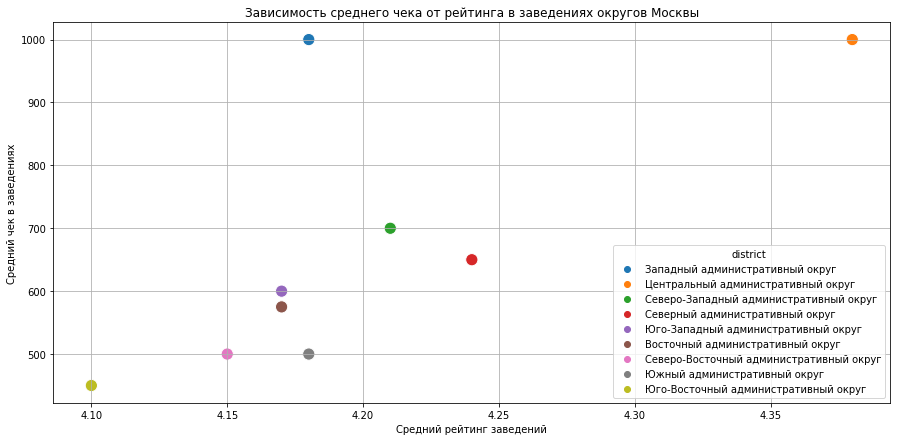

In [55]:
plt.figure(figsize = (15, 7))
sns.scatterplot(data =data_avg_bill, x='rating', y='middle_avg_bill', hue = 'district',s=150)
plt.xlabel('Средний рейтинг заведений')
plt.grid()
plt.ylabel('Средний чек в заведениях')
plt.title('Зависимость среднего чека от рейтинга в заведениях округов Москвы')
plt.show()

In [56]:
print(f'Корелляция между медианным значением среднего чека и средним рейтингом составляет:')
data_avg_bill['middle_avg_bill'].corr(data_avg_bill['rating'])

Корелляция между медианным значением среднего чека и средним рейтингом составляет:


0.7052757821362315

__Самый высокий средний рейтинг и высокий медианный средний чек в Центральном округе Москвы__  
__В Западном административном округе медианный средний чек такой же высокий как и в Центральном округе , а средний ретинг ниже__  
__В Юго-Восточном округе и средний чек и средний рейтинг самые низкие__  
__В целом корреляция между медианным чеком и средним рейтингом достаточно сильная:70%-то есть можно сказать , что чем выше чек, тем выше рейтинг__  


___Соберите наблюдения по вопросам выше в один общий вывод___

__Вывод:__  
__Всего в датасете представлено 8406 заведений общественного питания Москвы: 2378 кафе, 2043 ресторана, 1413 кофеен, 765 баров,
633 пиццерий, 603 заведения быстрого питания, 315 столовых, 256 булочных__  

__В представленных заведениях от 0 до 1288 посадочных мест. Больше всего посадочных мест в ресторанах, барах,кофейнях и столовых.Аномально большое количество посадочных мест (более 400) чаще встречается в ресторанах,кафе,кофейнях и барах. Меньше всего посадочных мест в булочных__  

__Соотношение количества несетевых заведений к сетевым в датасете-62%/38%-5201 несетевое заведение и 3205 сетевых заведений.Среди сетевых заведений больше всего ресторанов ,кафе, кофейн и пиццерий , меньше всего столовых, булочных и баров__   
__Топ-15 популярных сетевых заведений Москвы:__  
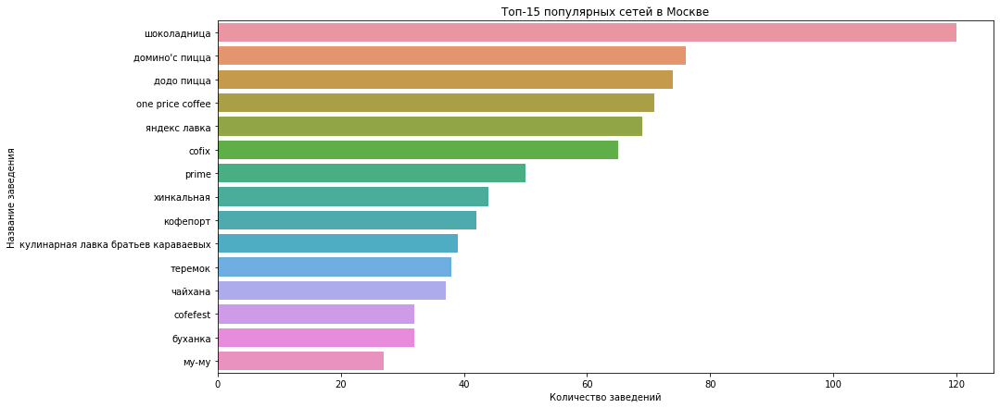

__В основном топ-15 сетей-это кофейни ,пиццерии,кафе и пекарни__  
__Сети занимаю 61% среди булочных, 52% среди пиццерий , 51% среди кофейн,38% среди заведений быстрого питания, 36% среди ресторанов,33% -среди кафе,28%-среди столовых, 22%-среди баров__  

__В датасете представлены районы Москвы :'Северный административный округ',
       'Северо-Восточный административный округ',
       'Северо-Западный административный округ',
       'Западный административный округ',
       'Центральный административный округ',
       'Восточный административный округ',
       'Юго-Восточный административный округ',
       'Южный административный округ',
       'Юго-Западный административный округ'__  
__Наибольшее кол-во заведений в Центральном округе , меньше всего заведений в Северо-Западном круге__  

__Усредненные рейтинги различных категорий заведений различаются не сильно (от 4.05 до 4.39) Относительно высокие рейтинги у  баров,ресторанов,пиццерий и кофеен низкие-у заведений быстрого питания__  

__В датасете нашлось 458 улиц , на которых расположен всего  1 объект общепита. Среди этих объектов больше всего кафе,ресторанов и кофеен.Меньше всего булочных и пиццерий.Так же можно отметить ,что эти заведения в основном несетевые__  

__Исследования среднего чека в разных районах Москвы показало, что дороже всего цены в заведениях в Центральном и Западном округе(средний чек 1000р), ниже всего- в Юго-восточном округе-450р.Средние цены в остальых округах (средний чек от 500р до 700р)__  

__Так же я исследовала зависимость среднего чека и рейтинга заведений по районам Москвы.__  
__В целом корреляция между медианным чеком и средним рейтингом достаточно сильная:70%-то есть можно сказать , что чем выше чек, тем выше рейтинг__  






___Шаг 4. Детализируем исследование: открытие кофейни___  
___Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуйте определить, осуществима ли мечта клиентов.___  
___Ответьте на следующие вопросы:___  
___Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?
Есть ли круглосуточные кофейни?___  
___Какие у кофеен рейтинги? Как они распределяются по районам?___  
___На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?___  
___По желанию вы можете расширить список вопросов для исследования, добавив собственные.___  
___Постройте визуализации. Попробуйте дать рекомендацию для открытия нового заведения. Это творческое задание: здесь нет правильного или неправильного ответа, но ваше решение должно быть чем-то обосновано. Объяснить свою рекомендацию можно текстом с описанием или маркерами на географической карте.___  

___Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения? Есть ли круглосуточные кофейни?___

In [57]:
data_coffee=data.query('category=="кофейня"')
print(f'Всего кофеен в датасете:')
len(data_coffee['name'])

Всего кофеен в датасете:


1413

In [58]:
print(f'Всего уникальных названий кофеен в датасете:')
data_coffee['name'].nunique()

Всего уникальных названий кофеен в датасете:


823

__Среди кофеен достаточно много сетевых-почти половина(уникальных названий намного меньше чем всего кофеен)__

_Посмотрим в каких районах расположены кофейни_

In [59]:
data_coffee_district=data_coffee.groupby('district',as_index=False)['name'].agg('count').sort_values(by='name',ascending=False)
data_coffee_district

,district,name
5,Центральный административный округ,428
2,Северный административный округ,193
3,Северо-Восточный административный округ,159
1,Западный административный округ,150
8,Южный административный округ,131
0,Восточный административный округ,105
7,Юго-Западный административный округ,96
6,Юго-Восточный административный округ,89
4,Северо-Западный административный округ,62


Text(0.5, 1.0, 'Расположение кофеен по округам Москвы')

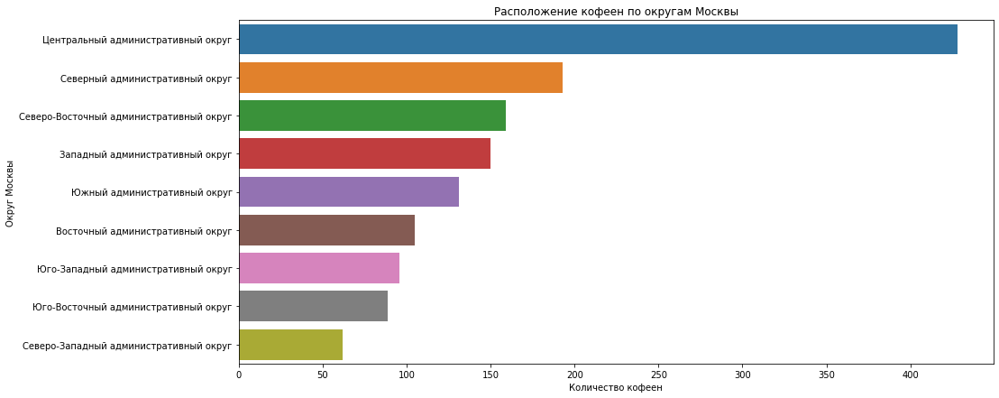

In [60]:
plt.figure(figsize=(15,7))
sns.barplot(data=data_coffee_district,x='name',y='district')
plt.ylabel('Округ Москвы')
plt.xlabel('Количество кофеен')
plt.title('Расположение кофеен по округам Москвы')

__В Центральном округе кофеен минимум в 2 раза больше , чем в остальных районах. Меньше всего кофеен в Северо-Западном округе__

In [61]:
data_coffee_24=data_coffee.groupby('is_24/7',as_index=False)['name'].agg('count')
data_coffee_24

,is_24/7,name
0,False,1339
1,True,59


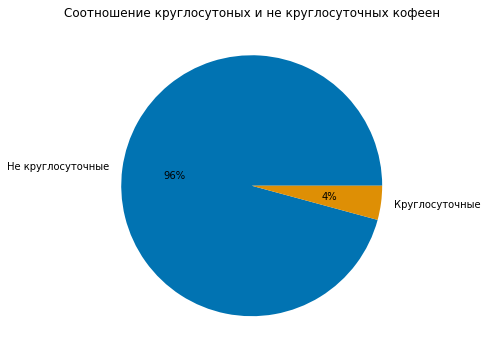

In [62]:
plt.figure(figsize=(10,6))
labels = ['Не круглосуточные', 'Круглосуточные']
plt.title('Соотношение круглосутоных и не круглосуточных кофеен')

#define Seaborn color palette to use
colors = sns.color_palette('colorblind')[ 0:2 ]

#create pie chart
plt.pie(data_coffee_24['name'], labels = labels, colors = colors, autopct='%.0f%%')
plt.show()

In [63]:
#посмотрим , что это за круглосуточные кофейни 
data_coffee.loc[data_coffee['is_24/7']==True]['name'].unique()

array(['wild bean', 'wild bean cafe', 'шоколадница', 'кофе хауз',
       'кофемания', 'you&coffee', 'cinnabon', 'one price coffee',
       'one&double', 'cofix', 'кофе с собой', 'пирог хауз', 'молоко',
       'гоголь-моголь', 'one and double', 'столица', 'лаванда кофе',
       'кофе on', 'foodmoscowcoffee', 'the wild bean cafe',
       'one more, please'], dtype=object)

__Круглосуточных кофеен всего 4% от всего количества кофеен-и среди них много сетевых__

___Какие у кофеен рейтинги? Как они распределяются по районам?___

In [64]:
data_coffee_rating=data_coffee.groupby('district',as_index=False)['rating'].mean().sort_values(by='rating',ascending=False)
data_coffee_rating['rating']=round(data_coffee_rating['rating'],2)
data_coffee_rating

,district,rating
5,Центральный административный округ,4.34
4,Северо-Западный административный округ,4.33
2,Северный административный округ,4.29
7,Юго-Западный административный округ,4.28
0,Восточный административный округ,4.28
8,Южный административный округ,4.23
6,Юго-Восточный административный округ,4.23
3,Северо-Восточный административный округ,4.22
1,Западный административный округ,4.20


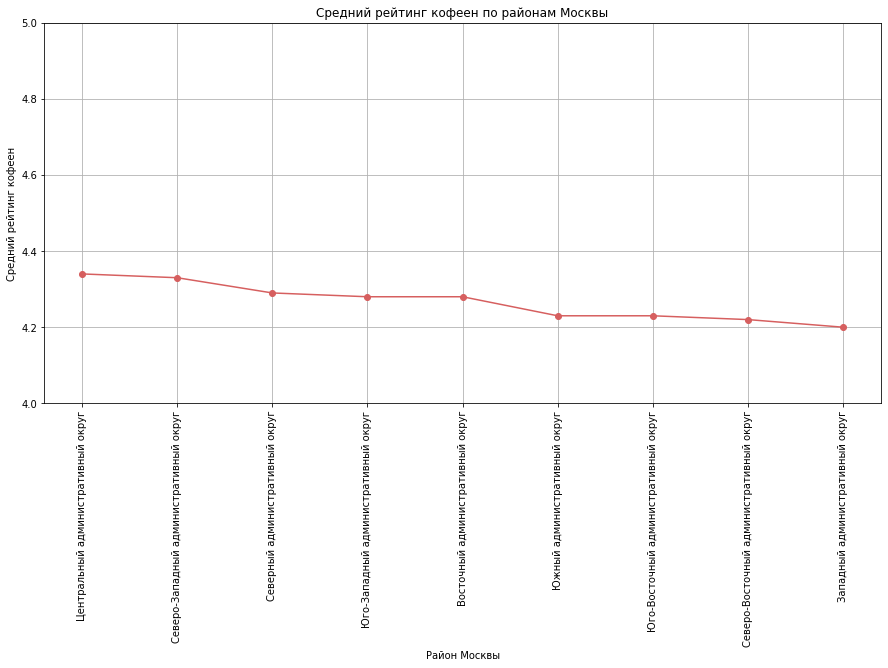

In [65]:
fig, ax = plt.subplots(figsize=(15, 7))
plt.plot(data_coffee_rating['district'],data_coffee_rating['rating'],marker='o',color='r')
ax.set_ylim([4,5])
ax.set_xlabel('Район Москвы')
plt.xticks(rotation=90)
plt.grid()
ax.set_ylabel('Средний рейтинг кофеен')
ax.set_title('Средний рейтинг кофеен по районам Москвы')
plt.show()

__Относительно высокие рейтинги у кофеен в Центральном и Северо-Западном округе, низкие-в Западном округе Москвы__

___На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?___

In [66]:
data_coffee_cup=data_coffee.groupby('district',as_index=False)['middle_coffee_cup'].median().sort_values(by='middle_coffee_cup',ascending=False)
data_coffee_cup

,district,middle_coffee_cup
7,Юго-Западный административный округ,198.0
5,Центральный административный округ,190.0
1,Западный административный округ,189.0
4,Северо-Западный административный округ,165.0
3,Северо-Восточный административный округ,162.5
2,Северный административный округ,159.0
8,Южный административный округ,150.0
6,Юго-Восточный административный округ,147.5
0,Восточный административный округ,135.0


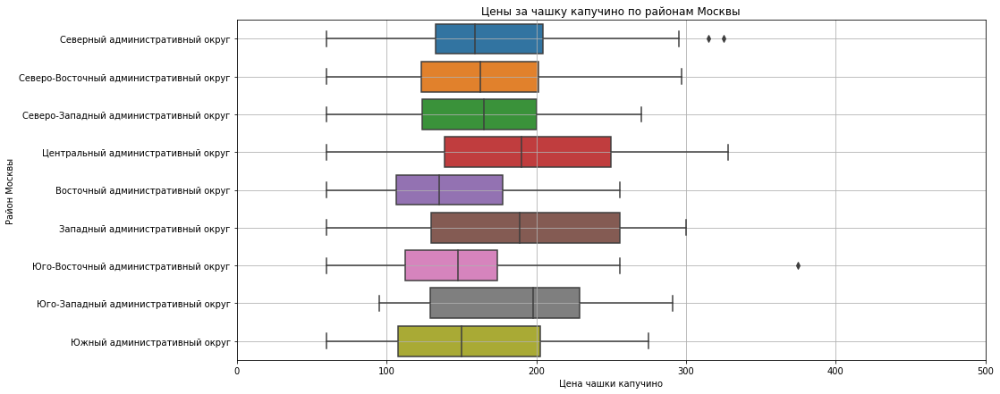

In [67]:
plt.figure(figsize=(15, 7))
sns.boxplot(x='middle_coffee_cup', y='district', data=data_coffee) 
plt.xlabel('Цена чашки капучино')
plt.ylabel('Район Москвы')
plt.xlim(0,500)
plt.grid()
plt.title('Цены за чашку капучино по районам Москвы')
plt.show()

__Стомость чашки капучино варьируется в различных округах Москвы от 135 руб до 198 руб. Самый дорогой кофе в Юго-Западном , Центральном и Западном округах, недорогой- в  Восточном округе__

In [68]:
#найдем улицы, на которых расположено всего 1 заведение общепита и это не кофейня 
data_coffee_one=data_street_one.query('category!="кофейня"')
data_coffee_one

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street_name,is_24/7
15,дом обеда,столовая,"Москва, улица Бусиновская Горка, 2",Северный административный округ,пн-пт 08:30–18:30; сб 10:00–20:00,55.885890,37.493264,4.1,средние,Средний счёт:300–500 ₽,400.0,NaN,0,180.0,улица Бусиновская Горка,False
21,7/12,кафе,"Москва, Прибрежный проезд, 7",Северный административный округ,"ежедневно, 10:00–22:00",55.876805,37.464934,4.5,NaN,NaN,NaN,NaN,0,NaN,Прибрежный проезд,False
73,веранда,ресторан,"Москва, парк Алтуфьево",Северо-Восточный административный округ,"пн-пт 11:00–22:00; сб,вс 11:00–23:00",55.906875,37.582493,4.2,NaN,NaN,NaN,NaN,1,NaN,парк Алтуфьево,False
97,жигулевское,"бар,паб","Москва, Бибиревская улица, 7к2",Северо-Восточный административный округ,"пн-чт 14:00–00:00; пт,сб 14:00–02:00; вс 14:00...",55.879733,37.593734,4.5,средние,Цена бокала пива:90–230 ₽,NaN,NaN,0,NaN,Бибиревская улица,False
103,тетри,быстрое питание,"Москва, Лианозовский проезд, вл1",Северо-Восточный административный округ,вт-вс 09:00–19:00,55.896922,37.554929,4.0,средние,Средний счёт:150–250 ₽,200.0,NaN,0,NaN,Лианозовский проезд,False
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
8256,torsher,кафе,"Москва, улица Васильцовский Стан, 5, корп. 1",Юго-Восточный административный округ,"ежедневно, 11:00–23:00",55.713826,37.750712,4.7,средние,Средний счёт:700–1500 ₽,1100.0,NaN,0,48.0,улица Васильцовский Стан,False
8282,пекорино,пиццерия,"Москва, Пронская улица, 2",Юго-Восточный административный округ,"ежедневно, 12:00–00:00",55.702921,37.845746,4.6,выше среднего,Средний счёт:1000–2000 ₽,1500.0,NaN,0,80.0,Пронская улица,False
8289,мираж,ресторан,"Москва, улица Шкулёва, 2А",Юго-Восточный административный округ,"пн-пт 11:00–23:00; сб,вс 11:00–00:00",55.693340,37.746231,4.7,NaN,NaN,NaN,NaN,0,90.0,улица Шкулёва,False
8317,беседка,кафе,"Москва, Кузьминская улица, 10",Юго-Восточный административный округ,"ежедневно, 11:00–23:00",55.690691,37.787735,4.1,NaN,NaN,NaN,NaN,1,NaN,Кузьминская улица,False


_С помощью кластеров ,отобразим на карте Москвы заведения  (не кофейни ) , которые расположены на улицах с 1 заведением общепита_

In [69]:
# moscow_lat - широта центра Москвы, moscow_lng - долгота центра Москвы
moscow_lat, moscow_lng = 55.751244, 37.618423

# создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)
# создаём пустой кластер, добавляем его на карту
marker_cluster = MarkerCluster().add_to(m)

# пишем функцию, которая принимает строку датафрейма,
# создаёт маркер в текущей точке и добавляет его в кластер marker_cluster
def create_clusters(row):
    Marker(
        [row['lat'], row['lng']],
        popup=f"{row['name']}",
    ).add_to(marker_cluster)

# применяем функцию create_clusters() к каждой строке датафрейма
data_coffee_one.apply(create_clusters, axis=1)

# выводим карту
m

_Думаю, что можно порекомедовать инвесторам присмотреться к улицам в Западном округе , на которых находится 1 заведение общепита (не кофейня), выведем названия этих улиц_

In [70]:
data_coffee_zao=data_coffee_one.query('district=="Западный административный округ"')
data_coffee_zao['street_name'].unique()

array(['Оршанская улица', 'Крылатский мост', 'Молдавская улица',
       'Полоцкая улица', 'улица Неверовского', 'Промышленный проезд',
       'Тучковская улица', 'Островная улица', 'улица Олеко Дундича',
       'улица Пивченкова', 'Звенигородская улица', 'Ворошиловский парк',
       'аллея Молодожёнов', 'Тарутинская улица', 'Кутузовский проезд',
       'улица Ивана Франко', 'Платовская улица', '1-й Сетуньский проезд',
       'улица Раевского', 'улица Клочкова', 'Инициативная улица',
       'улица Говорова',
       'Ботанический сад Московского государственного университета',
       'улица Генерала Дорохова', 'Барвихинская улица',
       'улица МЖД Киевское 5-й км', 'Дорогобужская улица',
       'улица Ватутина', '2-й переулок Петра Алексеева', 'улица Кутузова',
       'Воробьёвская набережная', 'Московская улица', 'Боровское шоссе'],
      dtype=object)

__Вывод:__  
__Возможно, я бы порекомендовала инвесторам , при выборе места для открытия кофейни обратить внимание на одну из улиц, на которых расположено всего 1 заведение общепита , и желательно , что бы это была не кофейня. Возможно, в Западном округе , т.к. там среднее количество кофеен, стоимость чашки кофе в кофейнях и средний чек в остальных заведениях один из самых высоких,что говорит о неплохом спросе на кофейни и общепиты(названия улиц можно найти в датасете data_coffee_zao). Стоимость чашки капучино я бы порекомендовала сделать среднюю , т.е 189 руб (для Западного округа).__

_Ссылка на презентацию : https://disk.yandex.ru/i/h1yhCWHlNuPulA_